# <center> Самостоятельная работа по Визуализация данных

In [68]:
#import matplotlib.pyplot as plt
#import seaborn as sns
#import plotly.express as px
import pandas as pd

covid_data = pd.read_csv('data/covid_data.csv')
#display(covid_data.head())

vaccinations_data = pd.read_csv('data/country_vaccinations.csv')
vaccinations_data = vaccinations_data[
    ['country', 'date', 'total_vaccinations', 
     'people_vaccinated', 'people_vaccinated_per_hundred',
     'people_fully_vaccinated', 'people_fully_vaccinated_per_hundred',
     'daily_vaccinations', 'vaccines']
]

covid_data = covid_data.groupby(
    ['date', 'country'], 
    as_index=False
)[['confirmed', 'deaths', 'recovered']].sum()
covid_data['date'] = pd.to_datetime(covid_data['date'])
covid_data['active'] = covid_data['confirmed'] - covid_data['deaths'] - covid_data['recovered']

covid_data = covid_data.sort_values(by=['country', 'date'])
covid_data['daily_confirmed'] = covid_data.groupby('country')['confirmed'].diff()
covid_data['daily_deaths'] = covid_data.groupby('country')['deaths'].diff()
covid_data['daily_recovered'] = covid_data.groupby('country')['recovered'].diff()

vaccinations_data['date'] = pd.to_datetime(vaccinations_data['date'])

#display(vaccinations_data.sort_values(by=['date']))
#display(covid_data)

covid_df = covid_data.merge(vaccinations_data,on=['date','country'], how='left')

covid_df['death_rate'] = covid_df['deaths'] / covid_df['confirmed'] * 100
covid_df['recovered_rate'] = covid_df['recovered'] / covid_df['confirmed'] * 100

covid_df[covid_df['country']=='United States']['death_rate'].max()
covid_df[covid_df['country']=='Russia']['recovered_rate'].mean()
#.groupby('country')

grouped_cases = covid_df.groupby('date')['daily_confirmed'].sum()
# grouped_cases.plot(     kind='line',    figsize=(12, 4),    title='Ежедневная заболеваемость во времени',     grid = True,     lw=3 );
# grouped_cases.plot(     kind='hist',    figsize=(10, 6),    title='Распределение ежедневной заболеваемости',    grid = True,    color = 'black',    bins=10);
grouped_country = covid_df.groupby(['country'])['confirmed'].last()
grouped_country = grouped_country.nlargest(10)
#grouped_country.plot(     kind='bar',     grid=True,      figsize=(12, 4),     colormap='plasma' );

grouped_country = covid_df.groupby(['country'])[['confirmed', 'deaths']].last()
grouped_country = grouped_country.nlargest(10, columns=['confirmed'])
#grouped_country.plot(     kind='bar',     grid=True,     figsize=(12, 4), );
covid_df.groupby(['country'])['total_vaccinations'].last().nsmallest(50).plot(kind='bar',figsize=(22, 4));
covid_df[covid_df['country']=='Russia'].groupby(['country'])['total_vaccinations'].last()


FileNotFoundError: [Errno 2] No such file or directory: 'data/covid_data.csv'

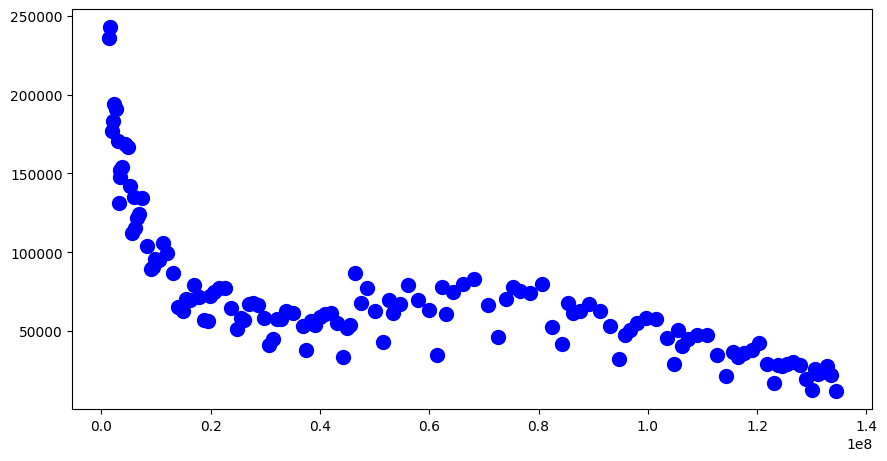

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('default')
us_data = covid_df[covid_df['country'] == 'United States']

fig = plt.figure(figsize=(8, 4))
axes = fig.add_axes([0, 0, 1, 1])
axes.scatter(
    x=us_data['people_fully_vaccinated'], 
    y=us_data['daily_confirmed'], 
    s=100,
    marker='o',
    c = 'blue'
);

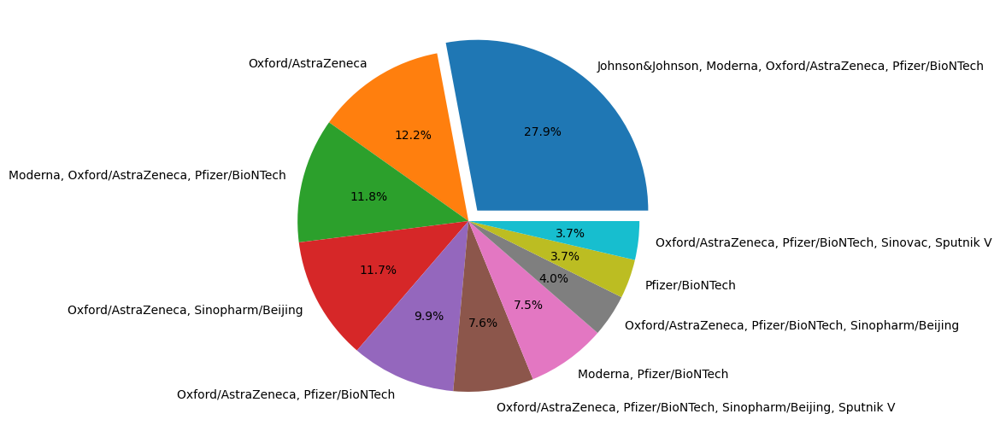

In [ ]:
vaccine_combinations = covid_df['vaccines'].value_counts()[:10]
fig = plt.figure(figsize=(5, 5))
axes = fig.add_axes([0, 0, 1, 1])
axes.pie(
    vaccine_combinations,
    labels=vaccine_combinations.index,
    autopct='%.1f%%',
    explode = [0.08, 0, 0, 0, 0, 0, 0, 0, 0, 0]
);

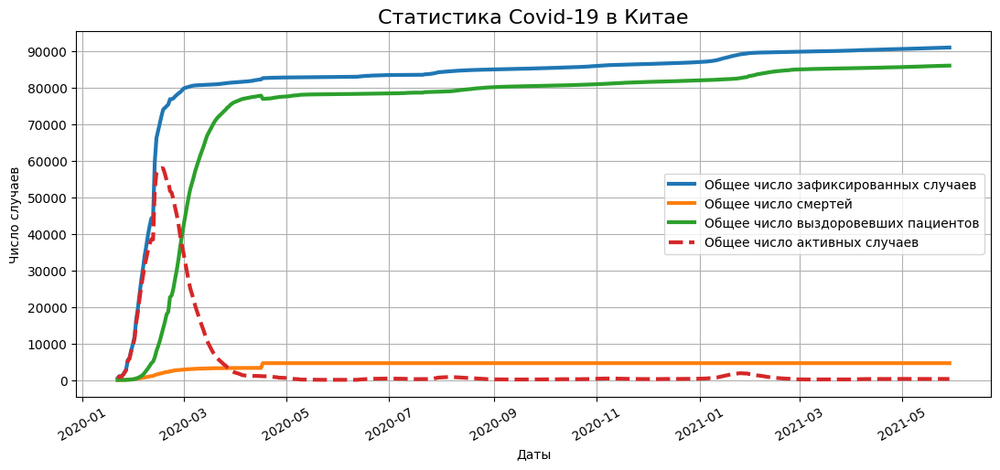

In [ ]:
china_data = covid_df[covid_df['country'] == 'China']
china_grouped = china_data.groupby(['date'])[['confirmed', 'active', 'deaths', 'recovered']].sum()

#визуализация графиков
fig = plt.figure(figsize=(10, 4))
axes = fig.add_axes([0, 0, 1, 1])
axes.plot(china_grouped['confirmed'], label='Общее число зафиксированных случаев', lw=3)
axes.plot(china_grouped['deaths'], label='Общее число смертей', lw=3)
axes.plot(china_grouped['recovered'], label='Общее число выздоровевших пациентов', lw=3)
axes.plot(china_grouped['active'], label='Общее число активных случаев', lw=3, linestyle='dashed')

#установка параметров отображения
axes.set_title('Статистика Covid-19 в Китае', fontsize=16)
axes.set_xlabel('Даты')
axes.set_ylabel('Число случаев')
axes.set_yticks(range(0, 100000, 10000))
axes.xaxis.set_tick_params(rotation=30)
axes.grid()
axes.legend();

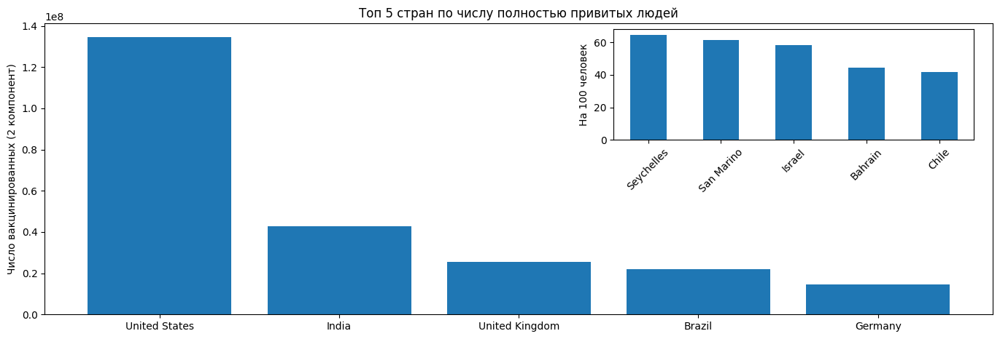

In [ ]:
vacc_country = covid_df.groupby('country')['people_fully_vaccinated'].last().nlargest(5)
vacc_country_per_hundred = covid_df.groupby('country')['people_fully_vaccinated_per_hundred'].last().nlargest(5)

#визуализация главного графика
fig = plt.figure(figsize=(13, 4))
main_axes = fig.add_axes([0, 0, 1, 1])
main_axes.bar(x = vacc_country.index, height = vacc_country);
main_axes.set_ylabel('Число вакцинированных (2 компонент)')
main_axes.set_title('Топ 5 стран по числу полностью привитых людей')

#визуализация вспомогательного графика
insert_axes = fig.add_axes([0.6, 0.6, 0.38, 0.38])
insert_axes.bar(x = vacc_country_per_hundred.index, height = vacc_country_per_hundred, width=0.5);
insert_axes.set_ylabel('На 100 человек')
insert_axes.xaxis.set_tick_params(rotation=45)

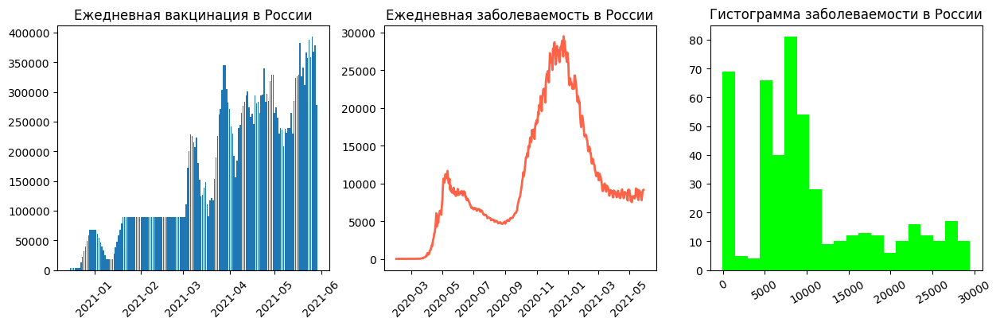

In [ ]:
russia_data = covid_df[covid_df["country"] == "Russia"]

# визуализация систем координат
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 4))

# столбчатая диаграмма
axes[0].bar(
    x=russia_data["date"],
    height=russia_data["daily_vaccinations"],
    label="Число вакцинированных",
)
axes[0].set_title("Ежедневная вакцинация в России")
axes[0].xaxis.set_tick_params(rotation=45)

# линейный график
axes[1].plot(
    russia_data["date"],
    russia_data["daily_confirmed"],
    label="Число заболевших",
    color="tomato",
    lw=2,
)
axes[1].set_title("Ежедневная заболеваемость в России")
axes[1].xaxis.set_tick_params(rotation=45)

# гистограмма
axes[2].hist(
    x=russia_data["daily_confirmed"], label=["Число заболевших"], color="lime", bins=20
)
axes[2].set_title("Гистограмма заболеваемости в России")
axes[2].xaxis.set_tick_params(rotation=30)

<BarContainer object of 5 artists>

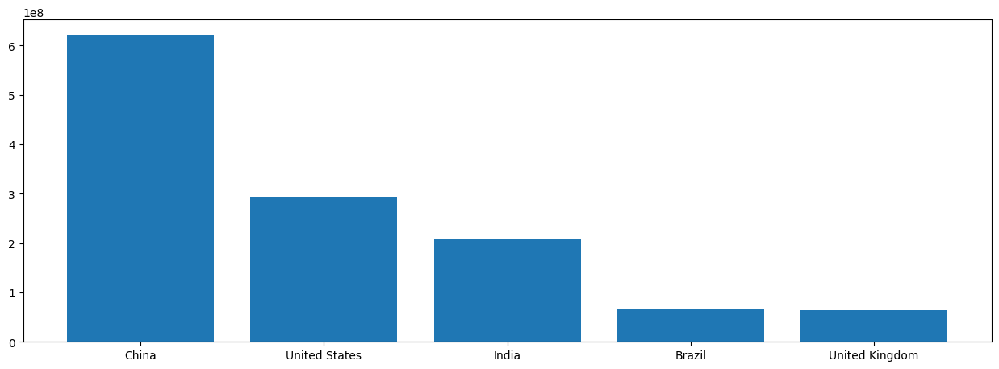

In [ ]:
v = covid_df.groupby(['country'])['total_vaccinations'].last().nlargest(5)
fig = plt.figure(figsize=(12, 4))
axes = fig.add_axes([0, 0, 1, 1])
axes.bar(x=v.index,height=v)

0.13.2


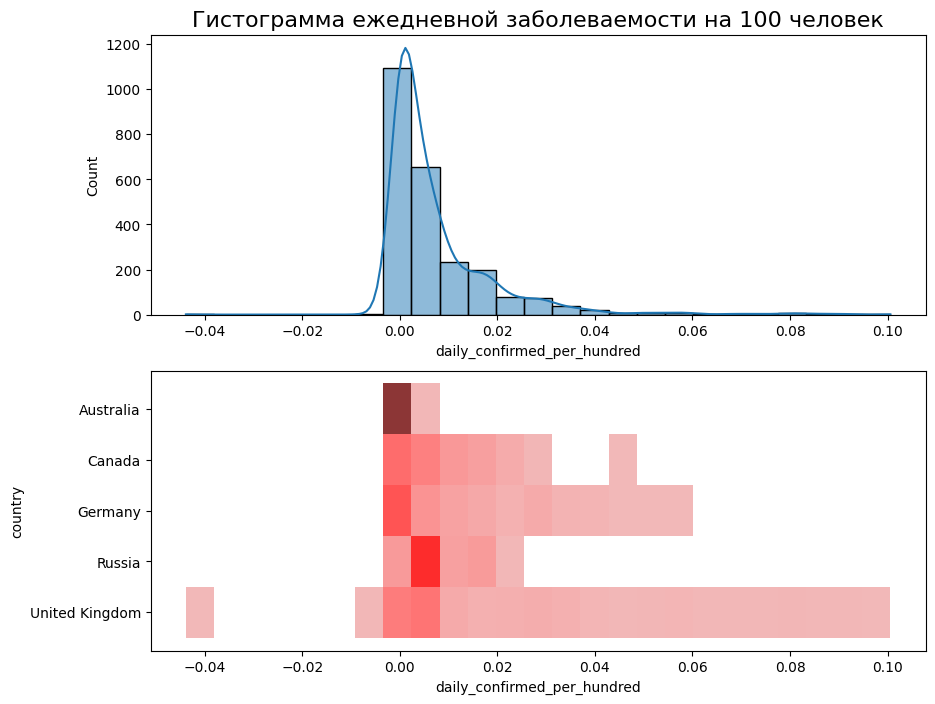

In [ ]:
import seaborn as sns
print(sns.__version__)
countries = ['Russia', 'Australia', 'Germany', 'Canada', 'United Kingdom']
croped_covid_df = covid_df[covid_df['country'].isin(countries)]

populations = pd.DataFrame([
    ['Canada', 37664517],
    ['Germany', 83721496],
    ['Russia', 145975300],
    ['Australia', 25726900],
    ['United Kingdom', 67802690]
    ],
    columns=['country', 'population']
)
croped_covid_df = croped_covid_df.merge(populations, on=['country'])
croped_covid_df['daily_confirmed_per_hundred'] = croped_covid_df['daily_confirmed'] / croped_covid_df['population'] * 100
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))
sns.histplot(
    data=croped_covid_df,
    x='daily_confirmed_per_hundred',
    bins=25,
    kde=True,
    ax=axes[0]
);
axes[0].set_title('Гистограмма ежедневной заболеваемости на 100 человек', fontsize=16)
sns.histplot(
    data=croped_covid_df,
    x='daily_confirmed_per_hundred',
    y='country',
    bins=25,
    color='red',
    ax=axes[1]
);

C:\Users\deeba\AppData\Local\Temp\ipykernel_35716\3932009178.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


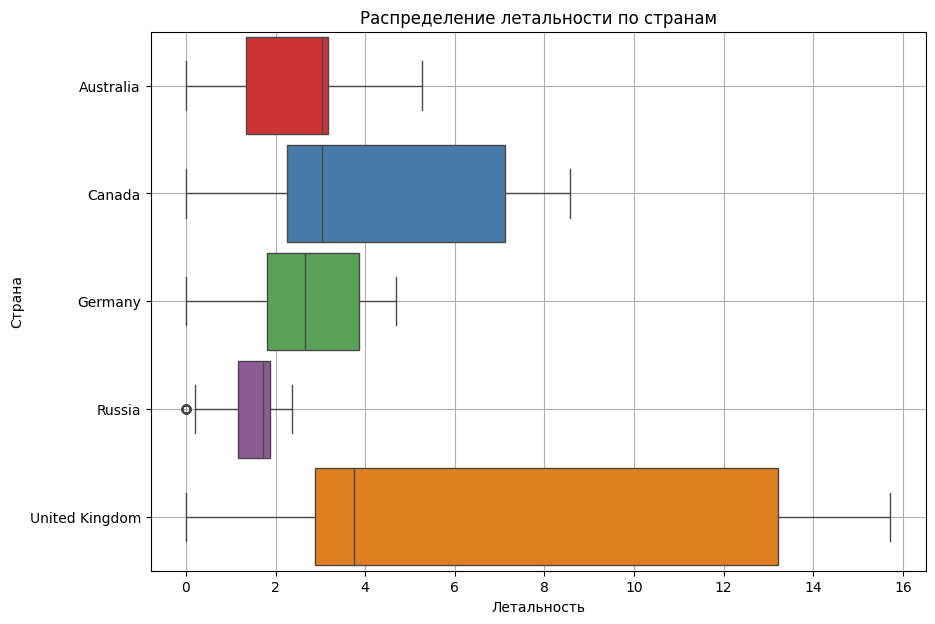

In [ ]:
fig = plt.figure(figsize=(10, 7))
sns.color_palette("Set2")
sns.color_palette()
boxplot = sns.boxplot(
    data=croped_covid_df,
    y='country',
    x='death_rate',
    orient='h',
    width=0.9,
    palette='Set1'
)
boxplot.set_title('Распределение летальности по странам');
boxplot.set_xlabel('Летальность');
boxplot.set_ylabel('Страна');
boxplot.grid()

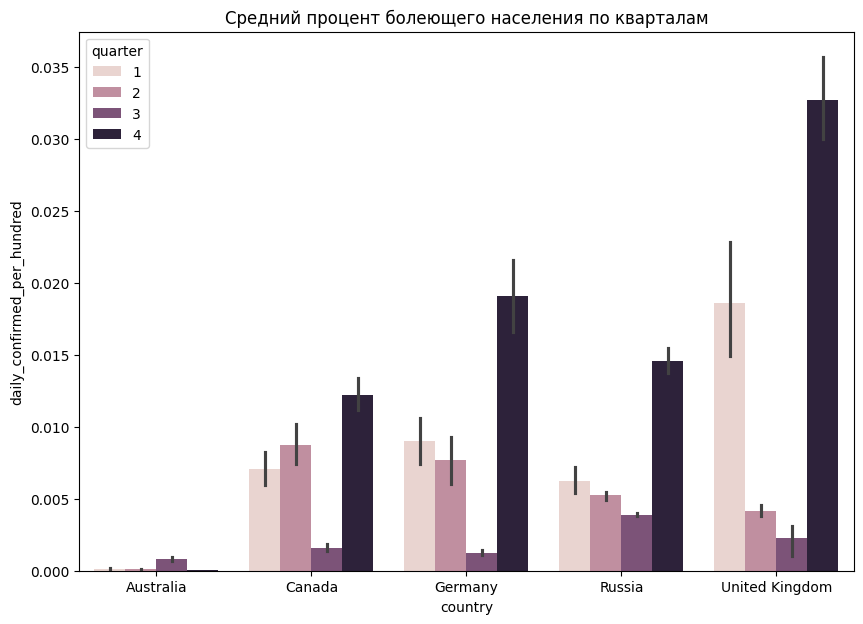

In [ ]:
fig = plt.figure(figsize=(10, 7))
croped_covid_df['quarter'] = croped_covid_df['date'].dt.quarter
barplot = sns.barplot(
    data=croped_covid_df,
    x='country',
    y='daily_confirmed_per_hundred',
    hue='quarter',
)
barplot.set_title('Средний процент болеющего населения по кварталам');

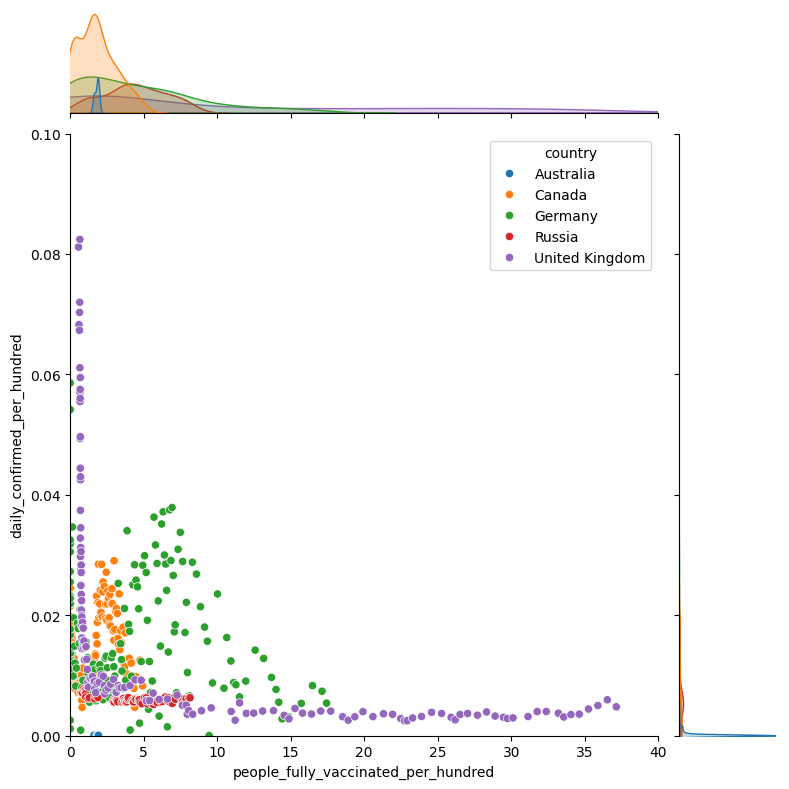

In [ ]:
jointplot = sns.jointplot(
    data=croped_covid_df, 
    x='people_fully_vaccinated_per_hundred', 
    y='daily_confirmed_per_hundred',
    hue='country',
    xlim = (0, 40),
    ylim = (0, 0.1),
    height=8,
)

In [ ]:
pivot = croped_covid_df.pivot_table(
    values='people_vaccinated_per_hundred',
    columns='date',
    index='country',
)
pivot.columns = pivot.columns.astype('string')
display(pivot)

date,2020-12-13,2020-12-14,2020-12-15,2020-12-16,2020-12-17,2020-12-18,2020-12-19,2020-12-20,2020-12-21,2020-12-22,...,2021-05-20,2021-05-21,2021-05-22,2021-05-23,2021-05-24,2021-05-25,2021-05-26,2021-05-27,2021-05-28,2021-05-29
country,,,,,,,,,,,,,,,,,,,,,
Australia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,12.40,12.69,12.88,13.28,13.73,14.18
Canada,NaN,0.0,0.00,0.01,0.02,0.03,0.03,0.03,0.05,0.07,...,48.10,49.25,50.14,50.89,51.77,52.39,53.05,53.95,54.99,55.71
Germany,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,39.18,39.68,39.95,40.11,40.29,40.64,41.29,41.87,42.40,42.61
Russia,NaN,NaN,0.02,NaN,NaN,NaN,NaN,NaN,NaN,0.04,...,10.20,10.30,10.50,10.53,10.70,10.81,11.07,11.12,11.19,11.29
United Kingdom,0.13,NaN,NaN,NaN,NaN,NaN,NaN,0.99,NaN,NaN,...,55.01,55.33,55.63,55.82,55.99,56.27,56.61,56.99,57.29,57.56


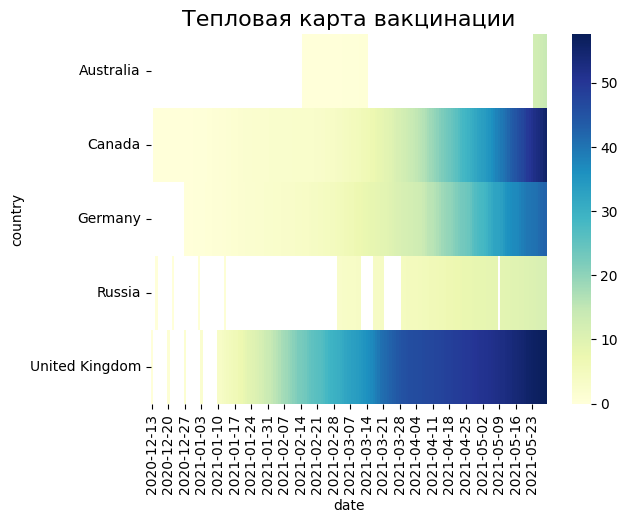

In [ ]:
heatmap = sns.heatmap(data=pivot, cmap='YlGnBu')
heatmap.set_title('Тепловая карта вакцинации', fontsize=16);

date,2020-01-23,2020-01-25,2020-01-26,2020-01-27,2020-01-28,2020-01-29,2020-01-30,2020-01-31,2020-02-01,2020-02-02,...,2021-05-20,2021-05-21,2021-05-22,2021-05-23,2021-05-24,2021-05-25,2021-05-26,2021-05-27,2021-05-28,2021-05-29
country,,,,,,,,,,,,,,,,,,,,,
Australia,0.0,0.000016,0.000016,0.000019,0.000019,0.000019,0.000035,0.000035,0.000047,0.000047,...,0.116606,0.116621,0.116637,0.116683,0.116722,0.116788,0.116854,0.116897,0.116932,0.116983
Canada,NaN,NaN,0.000003,0.000003,0.000005,0.000005,0.000008,0.000008,0.000011,0.000011,...,3.599497,3.611526,3.620169,3.628017,3.632706,3.642529,3.648718,3.661252,3.669520,3.675536
Germany,NaN,NaN,NaN,NaN,0.000005,0.000005,0.000005,0.000006,0.000010,0.000012,...,4.345962,4.355632,4.363299,4.368845,4.371625,4.374704,4.380047,4.388347,4.395716,4.401106
Russia,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000001,0.000001,0.000001,...,3.368999,3.375035,3.380916,3.386963,3.392637,3.397954,3.403604,3.409708,3.415960,3.422232
United Kingdom,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000003,0.000003,0.000003,...,6.594230,6.598223,6.601946,6.605033,6.608528,6.612093,6.616504,6.621495,6.627439,6.632219


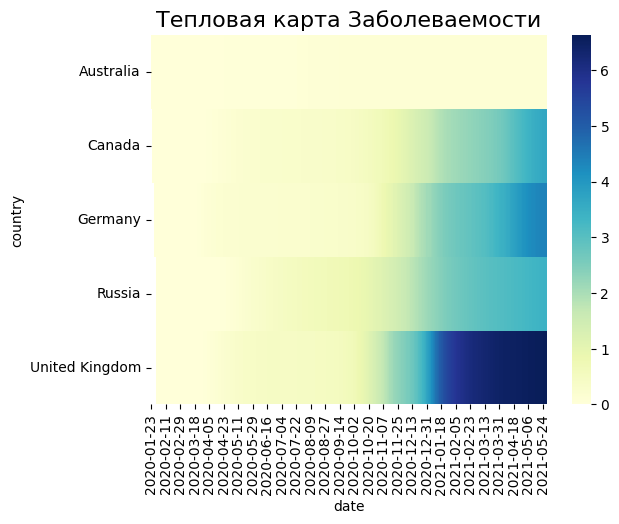

In [ ]:

croped_covid_df['confirmed_per_hundred'] = croped_covid_df['confirmed'] / croped_covid_df['population'] * 100
croped_covid_df.head()
pivot = croped_covid_df.pivot_table(
    values='confirmed_per_hundred',
    columns='date',
    index='country'
)
pivot.columns = pivot.columns.astype('string')
display(pivot)

heatmap = sns.heatmap(data=pivot, cmap='YlGnBu')
heatmap.set_title('Тепловая карта Заболеваемости', fontsize=16);

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2440 entries, 0 to 2439
Data columns (total 22 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   date                                 2440 non-null   datetime64[ns]
 1   country                              2440 non-null   object        
 2   confirmed                            2440 non-null   float64       
 3   deaths                               2440 non-null   float64       
 4   recovered                            2440 non-null   float64       
 5   active                               2440 non-null   float64       
 6   daily_confirmed                      2435 non-null   float64       
 7   daily_deaths                         2435 non-null   float64       
 8   daily_recovered                      2435 non-null   float64       
 9   total_vaccinations                   649 non-null    float64       
 10  people_vacci

C:\Users\deeba\AppData\Local\Temp\ipykernel_35716\2983064691.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  boxplot = sns.boxplot(


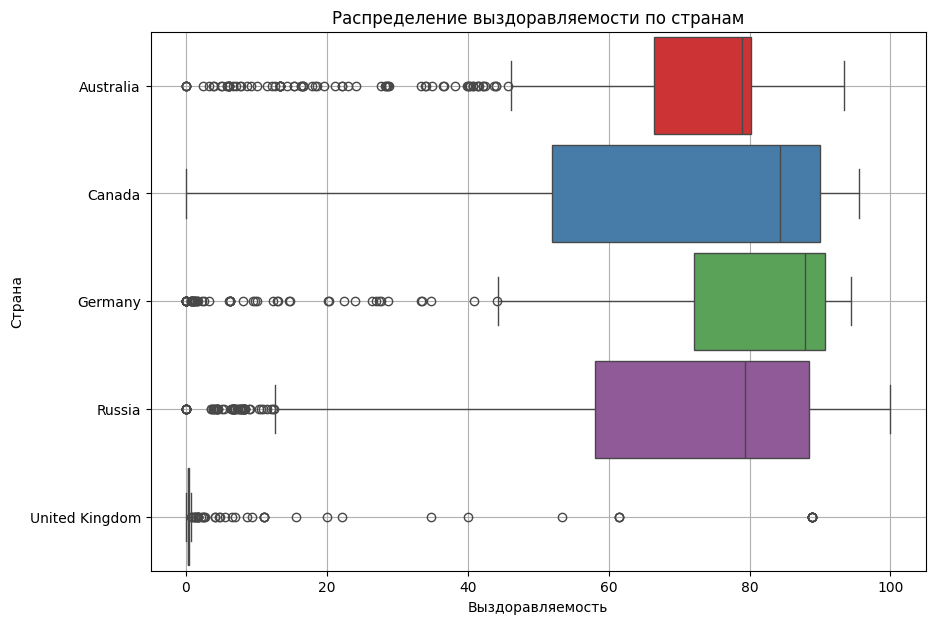

In [ ]:
fig = plt.figure(figsize=(10, 7))
sns.color_palette("Set2")

boxplot = sns.boxplot(
    data=croped_covid_df,
    y='country',
    x='recovered_rate',
    orient='h',
    width=0.9,
    palette='Set1'
)
boxplot.set_title('Распределение выздоравляемости по странам');
boxplot.set_xlabel('Выздоравляемость');
boxplot.set_ylabel('Страна');
boxplot.grid()

croped_covid_df.info()

In [ ]:

#!pip install plotly
#pip install --upgrade nbformat
pip show nbformat

import plotly
import plotly.express as px
print(plotly.__version__)

line_data = covid_df.groupby('date', as_index=False).sum()
fig = px.line(
    data_frame=line_data, #DataFrame
    x='date', #ось абсцисс
    y=['confirmed', 'recovered', 'deaths', 'active'], #ось ординат
    height=500, #высота
    width=1000, #ширина
    title='Confirmed, Recovered, Deaths, Active cases over Time' #заголовок
)
fig.show()

Name: nbformat
Version: 5.10.4
Summary: The Jupyter Notebook format
Home-page: https://jupyter.org
Author: 
Author-email: Jupyter Development Team <jupyter@googlegroups.com>
License: BSD 3-Clause License

- Copyright (c) 2001-2015, IPython Development Team
- Copyright (c) 2015-, Jupyter Development Team

All rights reserved.

Redistribution and use in source and binary forms, with or without
modification, are permitted provided that the following conditions are met:

1. Redistributions of source code must retain the above copyright notice, this
   list of conditions and the following disclaimer.

2. Redistributions in binary form must reproduce the above copyright notice,
   this list of conditions and the following disclaimer in the documentation
   and/or other materials provided with the distribution.

3. Neither the name of the copyright holder nor the names of its
   contributors may be used to endorse or promote products derived from
   this software without specific prior writte

In [ ]:
covid_df.head()

,date,country,confirmed,deaths,recovered,active,daily_confirmed,daily_deaths,daily_recovered,total_vaccinations,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,daily_vaccinations,vaccines,death_rate,recovered_rate
0,2020-02-24,Afghanistan,1.0,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
1,2020-02-25,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
2,2020-02-26,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
3,2020-02-27,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0
4,2020-02-28,Afghanistan,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0


In [ ]:
#считаем средний процент выздоровлений для каждой страны
bar_data = covid_df.groupby(
    by='country',
    as_index=False
)[['recovered_rate']].mean().round(2).nlargest(10, columns=['recovered_rate'])

#строим график
fig = px.bar(
    data_frame=bar_data, #датафрейм
    x="country", #ось x
    y="recovered_rate", #ось y
    color='country', #расцветка в зависимости от страны
    text = 'recovered_rate', #текст на столбцах
    orientation='v', #ориентация графика
    height=500, #высота
    width=1000, #ширина
    title='Top 10 Countries for Recovery Rate' #заголовок
)

#отображаем его
fig.show()

In [ ]:
#считаем среднее ежедневно фиксируемое количество выздоровевших по странам
treemap_data = covid_df.groupby(
    by='country',
    as_index=False
)[['daily_recovered']].mean()

#строим график
fig = px.treemap(
    data_frame=treemap_data, #DataFrame
    path=['country'], #категориальный признак, для которого строится график
    values='daily_recovered', #параметр, который сравнивается
    height=500, #высота
    width=1000, #ширина
    title='Daily Recovered Cases by Country' #заголовок
)

#отображаем график
fig.show()

In [ ]:
#преобразуем даты в строковый формат
choropleth_data = covid_df.sort_values(by='date')
choropleth_data['date'] = choropleth_data['date'].astype('string')

#строим график
fig = px.choropleth(
    data_frame=choropleth_data, #DataFrame
    locations="country", #столбец с локациями
    locationmode = "country names", #режим сопоставления локаций с базой Plotly
    color="confirmed", #от чего зависит цвет
    animation_frame="date", #анимационный бегунок
    range_color=[0, 30e6], #диапазон цвета
    title='Global Spread of COVID-19', #заголовок
    width=800, #ширина
    height=500, #высота
    color_continuous_scale='Reds' #палитра цветов
)

#отображаем график
fig.show()

C:\Users\deeba\AppData\Local\Temp\ipykernel_35716\2190693451.py:6: DeprecationWarning:

The library used by the *country names* `locationmode` option is changing in an upcoming version. Country names in existing plots may not work in the new version. To ensure consistent behavior, consider setting `locationmode` to *ISO-3*.



In [ ]:
#фильтруем таблицу по странам
countries=['United States', 'Russia', 'United Kingdom', 'Brazil', 'France']
scatter_data = covid_df[covid_df['country'].isin(countries)]

#строим график
fig = px.scatter_3d(
    data_frame=scatter_data, #DataFrame
    x = 'daily_confirmed', #ось абсцисс
    y = 'daily_deaths', #ось ординат
    z = 'daily_vaccinations', #ось аппликат
    color='country', #расцветка в зависимости от страны
    log_x=True, 
    log_y=True,
    width=1000,
    height=700
)

#отображаем график
fig.show()


In [ ]:
fig.write_html("plotly/scatter_3d.html")

In [ ]:
line_data = covid_df.groupby('date', as_index=False).sum()
fig = px.line(
    data_frame=line_data, #DataFrame
    x='date', #ось абсцисс
    y=['daily_vaccinations'], #ось ординат
    height=500, #высота
    width=1000, #ширина
    title='daily_vaccinations' #заголовок
)
fig.show()

In [ ]:


#преобразуем даты в строковый формат
choropleth_data = covid_df.sort_values(by='date')
choropleth_data['date'] = choropleth_data['date'].astype('string')

#строим график
fig = px.choropleth(
    data_frame=choropleth_data, #DataFrame
    locations="country", #столбец с локациями
    locationmode = "country names", #режим сопоставления локаций с базой Plotly
    color="total_vaccinations", #от чего зависит цвет
    animation_frame="date", #анимационный бегунок
    range_color=[0, 30e6], #диапазон цвета
    title='Global Spread of COVID-19', #заголовок
    width=800, #ширина
    height=500, #высота
    color_continuous_scale='Reds' #палитра цветов
)

#отображаем график
fig.show()

C:\Users\deeba\AppData\Local\Temp\ipykernel_35716\1232383357.py:6: DeprecationWarning:

The library used by the *country names* `locationmode` option is changing in an upcoming version. Country names in existing plots may not work in the new version. To ensure consistent behavior, consider setting `locationmode` to *ISO-3*.



9.1. Каково соотношение ушедших и лояльных клиентов? Покажите это на графике и дайте комментарий по соотношению.

In [18]:
import pandas as pd
import plotly
import plotly.express as px
print(plotly.__version__)
churn_data = pd.read_csv('data/churn.csv')
#display(churn_data.info())
churn_data['status_client'] = churn_data['Exited'].apply(lambda x: 'Lost' if x == 1 else 'Valid')
churn_data['count_client'] = 1
#display(churn_data.head())

df = churn_data.groupby('count_client', as_index=False).count()
df = churn_data
fig = px.pie(df,
             values='count_client',
             names='status_client',
             title='Соотношение количества действующих и потерянных клиентов',
             height=500, #высота
            width=700, #ширина
            )
fig.show()

6.3.0


In [3]:
#считаем количество действующих и ушедших клиентов
bar_data = churn_data.groupby(
    by='status_client',
    as_index=False
)['count_client'].count()

#строим график
fig = px.bar(
    data_frame=bar_data, #датафрейм
    x="status_client", #ось x
    y="count_client", #ось y
    color='status_client', #расцветка в зависимости от статуса
    text = 'count_client', #текст на столбцах - количество клиентов
    orientation='v', #ориентация графика
    height=500, #высота
    width=1000, #ширина
    title='Соотношение дйствующих и ушедших клиентов' #заголовок
)

#отображаем его
fig.show()

Анализируя графики можно сдлеать заключение, что ушло меньшее количетсво (20,4%) от общего числа клиентов. Пока ещё есть с кем работать.

9.2. Постройте график, показывающий распределение баланса пользователей, у которых на счету больше 2 500 долларов. Опишите распределение и сделайте выводы.

In [115]:
churn_data['class_client'] = churn_data['Balance'].apply(lambda x: int(((x+20000)/20000)) if x > 2500 else 0)

display(churn_data.head())

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,status_client,count_client,class_client,amount
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1,Lost,1,0,0$
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,Valid,1,5,100$
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,Lost,1,8,160$
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0,Valid,1,0,0$
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,Valid,1,7,140$


In [116]:
#считаем количество действующих и ушедших клиентов
bar_data = churn_data.groupby(
    by='class_client',
    as_index=False
)['count_client'].count().nlargest(20, columns=['count_client'])
#[['recovered_rate']].mean().round(2).nlargest(10, columns=['recovered_rate'])

#строим график
fig = px.bar(
    data_frame=bar_data, #датафрейм
    x="class_client", #ось x
    y="count_client", #ось y
    color='class_client', #расцветка в зависимости от статуса
    text = 'count_client', #текст на столбцах - количество клиентов
    orientation='v', #ориентация графика
    height=500, #высота
    width=1000, #ширина
    
    title='Распределение количества клиентов по сумме счета', #заголовок,
    subtitle='Класс клиента = n X 20 000$' #заголовок
)

#отображаем его
fig.show()

Судя по графику можно заключить что: 
1)большое количество клиентов имеют накопления до 2500$ 
2)клиенты с деньгами имеют накопления в дипазоне от 40 000$ до 200 000$

In [9]:
#считаем количество действующих и ушедших клиентов
bar_data = churn_data.groupby(
    by='class_client',
    as_index=False
)['Balance'].sum().nlargest(20, columns=['Balance'])
#[['recovered_rate']].mean().round(2).nlargest(10, columns=['recovered_rate'])

#строим график
fig = px.bar(
    data_frame=bar_data, #датафрейм
    x="class_client", #ось x
    y="Balance", #ось y
    color='class_client', #расцветка в зависимости от статуса
    text = 'Balance', #текст на столбцах - количество клиентов
    orientation='v', #ориентация графика
    height=500, #высота
    width=1000, #ширина
    
    title='Распределение баланса клиентов по сумме счета', #заголовок,
    subtitle='Класс клиента = n X 20 000$' #заголовок
)

#отображаем его
fig.show()

По графику можно сделать вывод, что больше всего денег приносят в банк клиенты, у которых на счетах от 100 000$  до 180 000$

In [256]:
display(churn_data)

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,status_client,count_client,class_client,amount,CreditScoreCat
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1,Lost,1,0,0$,Fair
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,Valid,1,5,100$,Fair
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,Lost,1,8,160$,Poor
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0,Valid,1,0,0$,Good
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,Valid,1,7,140$,Excellent
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0,Valid,1,0,0$,Good
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0,Valid,1,3,60$,Poor
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1,Lost,1,0,0$,Good
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1,Lost,1,4,80$,Good


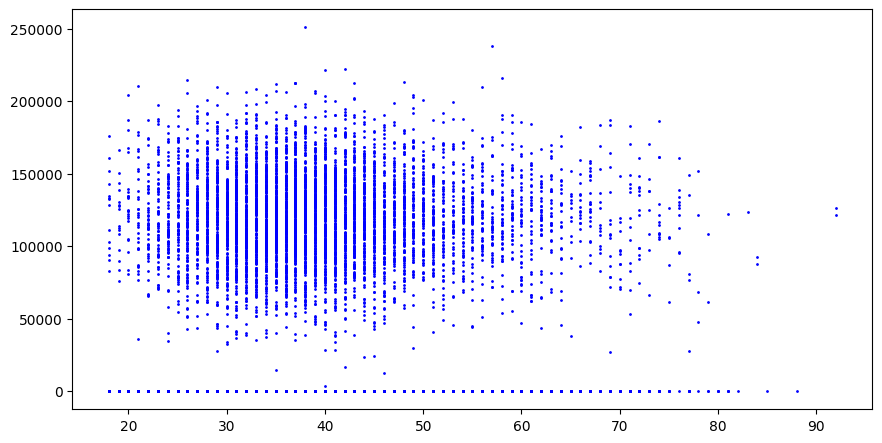

In [257]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('default')
#balance_data = churn_data[covid_df['country'] == 'United States']

fig = plt.figure(figsize=(8, 4))
axes = fig.add_axes([0, 0, 1, 1])
axes.scatter(
    x=churn_data['Age'], 
    y=churn_data['Balance'], 
    s=1,
    marker='o',
    c = 'blue'
);

In [15]:
#фильтруем таблицу по странам
#countries=['United States', 'Russia', 'United Kingdom', 'Brazil', 'France']
#scatter_data = covid_df[covid_df['country'].isin(countries)]

#строим график
fig = px.scatter_3d(
    data_frame=churn_data, #DataFrame
    x = 'EstimatedSalary', #ось абсцисс
    y = 'Age', #ось ординат
    z = 'Balance', #ось аппликат
    color='Exited', #расцветка в зависимости от страны
    log_x=True, 
    log_y=True,
    width=1000,
    height=700
)

#отображаем график
fig.show()

9.3 Посмотрите на распределение баланса клиента в разрезе признака оттока. 
Как различаются суммы на накопительном счёте ушедших и лояльных клиентов? 
Подумайте и напишите, с чем это может быть связано, что может не устраивать ушедших клиентов в банке.


In [123]:
df = churn_data.groupby('Balance', as_index=False).count()
df = churn_data
fig = px.pie(df,
             values='Balance',
             names='status_client',
             title='Соотношение сумм на счетах действующих и потерянных клиентов',
             height=500, #высота
            width=700, #ширина
            )
fig.show()

Из графика следует что ушедшие клиенты имели в 4 раза меньше денег в среднем, чем действующие. Из чего можно сделать вывод что действующие в банке продукты не учитывают интересы клиентов с небольшим количеством денег.

In [129]:
import numpy as np
bar_data = churn_data.pivot_table(values='Balance', 
                                  index='class_client',
                                  columns='status_client',
                                  aggfunc='sum',
                                  fill_value=0 ).reset_index()#.unstack().transpose()
#bar_data = bar_data.drop('status_client', axis=1)
melted_data = bar_data.melt(
    id_vars='class_client',
    var_name='status_client',
    value_name='sum'
)
bar_data['lost_valid_rate'] = bar_data['Lost'] / bar_data['Valid']
bar_data = bar_data.replace([np.inf, -np.inf], np.nan)
bar_data['lost_valid_rate'] = bar_data['lost_valid_rate'].fillna(0)
display(bar_data)

status_client,class_client,Lost,Valid,lost_valid_rate
0,0,0.00,0.000000e+00,0.000000
1,1,16227.88,3.115639e+04,0.520852
2,2,280803.52,5.600900e+05,0.501354
3,3,1678396.28,4.869953e+06,0.344643
4,4,6052128.35,2.482820e+07,0.243760
5,5,18070847.60,7.312623e+07,0.247119
6,6,49405694.24,1.289844e+08,0.383036
7,7,52766815.38,1.585948e+08,0.332715
8,8,32401400.00,1.111881e+08,0.291411
9,9,14888302.59,5.637012e+07,0.264117


In [130]:
#строим график
fig = px.bar(
    data_frame=bar_data, #датафрейм
    x="class_client", #ось x
    y="lost_valid_rate", #ось y
    #color='status_client', #расцветка в зависимости от статуса
    #text = 'Balance', #текст на столбцах - количество клиентов
    orientation='v', #ориентация графика
    #barmode='group',
    height=500, #высота
    width=1000, #ширина
    
    title='Отношение ушедших денег к оставшимся по классам', #заголовок,
    subtitle='Класс клиента = n X 20 000$' #заголовок
)

#отображаем его
fig.show()

Из графика видно, что денег больше ушло чем осталось в сегменте суммы счета 220 000$ и 240 000$, и сильно уходят клиенты с балансами до 40 000$ и отток наблюдается в сегменте 120 000$ 

In [131]:

#строим график
fig = px.bar(
    data_frame=melted_data, #датафрейм
    x="class_client", #ось x
    y="sum", #ось y
    color='status_client', #расцветка в зависимости от статуса
    #text = 'Balance', #текст на столбцах - количество клиентов
    orientation='v', #ориентация графика
    #barmode='group',
    height=500, #высота
    width=1000, #ширина
    
    title='Распределение оставшихся и ушедших клиентов по сумме счета', #заголовок,
    subtitle='Класс клиента = n X 20 000$' #заголовок
)

#отображаем его
fig.show()

Из графика видно, что в абсолютных значениях больше всего ушло клиентов с суммой счета от 140 000$ до 160 000$ которые являются главным составляющим в балансе банка.

Учитывая 3 предыдущих графика можно предположить, что у банка плохие программы для держателей крупных сумм и не достаточно хорошие для мелких сумм.

9.4. Посмотрите на распределение возраста в разрезе признака оттока. В какой группе больше потенциальных выбросов? На какую возрастную категорию клиентов стоит обратить внимание банку?

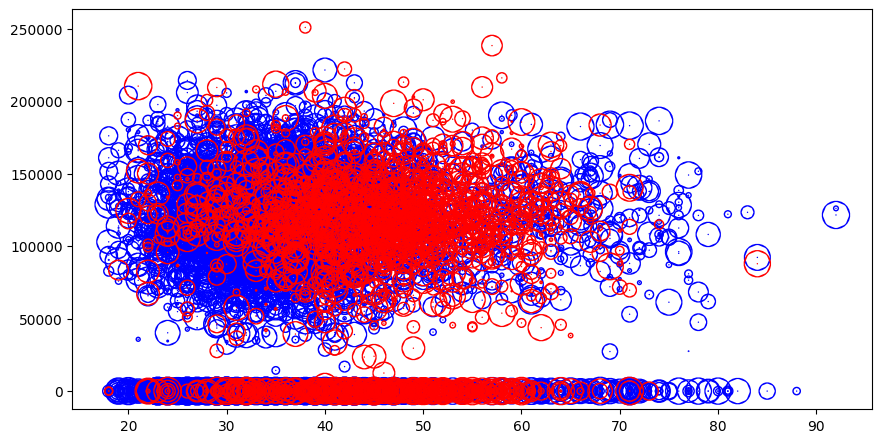

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('default')
balance_data = churn_data[churn_data['Exited'] == 0]
no_balance_data = churn_data[churn_data['Exited'] == 1]

fig = plt.figure(figsize=(8, 4))
axes = fig.add_axes([0, 0, 1, 1])
axes.scatter(
    x=balance_data['Age'], 
    y=balance_data['Balance'],
    linewidths=balance_data['EstimatedSalary']/10000,
    s=1,
    marker='o',
    c = 'blue',
);
axes.scatter(
    x=no_balance_data['Age'], 
    y=no_balance_data['Balance'],
    linewidths=no_balance_data['EstimatedSalary']/10000,
    s=1,
    marker='o',
    c = 'red',
);

Судя по получившемуся графику можно предположить что отток клиентов происходит у клиентов 40-50 лет и на них стоит банку обратить внимание.

9.5. Постройте график, который показывает взаимосвязь кредитного рейтинга клиента и его предполагаемой зарплаты. Добавьте расцветку по признаку оттока клиентов. Какова взаимосвязь между признаками? Если не видите явной взаимосвязи, укажите это.

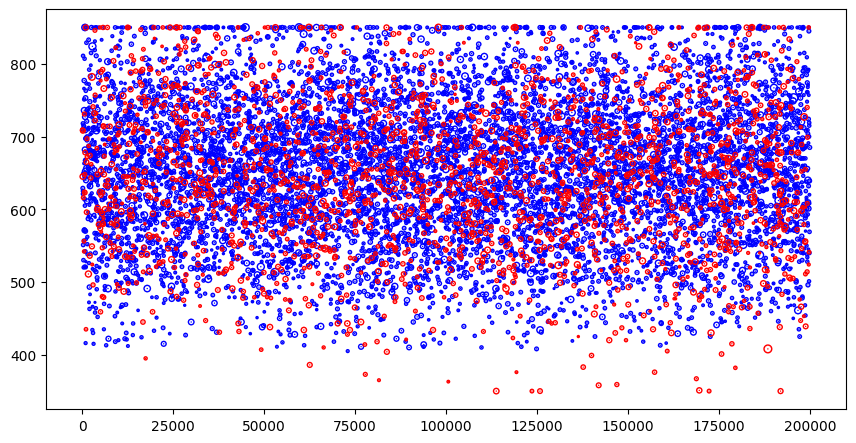

In [152]:
balance_data = churn_data[churn_data['Exited'] == 0]
no_balance_data = churn_data[churn_data['Exited'] == 1]

fig = plt.figure(figsize=(8, 4))
axes = fig.add_axes([0, 0, 1, 1])
axes.scatter(
    x=balance_data['EstimatedSalary'], 
    y=balance_data['CreditScore'],
    linewidths=balance_data['Age']/15,
    s=1,
    marker='o',
    c = 'blue',
);
axes.scatter(
    x=no_balance_data['EstimatedSalary'], 
    y=no_balance_data['CreditScore'],
    linewidths=no_balance_data['Age']/15,
    s=1,
    marker='o',
    c = 'red',
);

Судя по графику нет взаимосвязи между кредитным рейтингом и предполагаемой зарплатой, а так же нет корелляции с ушедшими клиентами. Из данного графика видно что средний кредитный рейтинг располагается в дипапзоне от 550 до 800.

9.6. Кто чаще уходит, мужчины или женщины? Постройте график, который иллюстрирует это.

In [165]:
df = churn_data[churn_data['Exited']==1].groupby('Gender', as_index=False).count()

fig = px.pie(df,
             values='count_client',
             names='Gender',
             title='Соотношение мужчин и женщин среди ушедших клиентов',
             height=500, #высота
            width=700, #ширина
            )
fig.show()

In [ ]:
Вывод: Среди ушедших клиентов больше мужчин.

9.7. Как отток клиентов зависит от числа приобретённых у банка услуг? Для ответа на этот вопрос постройте многоуровневую столбчатую диаграмму.

In [178]:
bar_data = churn_data.pivot_table(values='count_client', 
                                  index='NumOfProducts',
                                  columns='status_client',
                                  aggfunc='sum',
                                  fill_value=0 ).reset_index()#.unstack().transpose()
#bar_data = bar_data.drop('status_client', axis=1)
demelted_data = bar_data.melt(
    id_vars='NumOfProducts',
    var_name='status_client',
    value_name='sum'
)


In [180]:
#строим график
fig = px.bar(
    data_frame=demelted_data, #датафрейм
    x="NumOfProducts", #ось x
    y="sum", #ось y
    color='status_client', #расцветка в зависимости от статуса
    #text = 'Balance', #текст на столбцах - количество клиентов
    orientation='v', #ориентация графика
    barmode='group',
    height=500, #высота
    width=1000, #ширина
    
    title='Число клиентов в зависимости от кол-ва купленных услуг', #заголовок,
    
)

#отображаем его
fig.show()

Судя по графику количество преобретенных услуг обратнопропорционально количеству ушедших клиентов. Поэтому можно предположить, что чем меньше усшуг клиент купил, тем больше шансов его потерять.

9.8. Как влияет наличие статуса активного клиента на отток клиентов? Постройте диаграмму, иллюстрирующую это. Что бы вы предложили банку, чтобы уменьшить отток клиентов среди неактивных?

In [175]:
bar_data = churn_data.pivot_table(values='count_client', 
                                  index='IsActiveMember',
                                  columns='status_client',
                                  aggfunc='count',
                                  fill_value=0 ).reset_index()#.unstack().transpose()
#bar_data = bar_data.drop('status_client', axis=1)
demelted_data = bar_data.melt(
    id_vars='IsActiveMember',
    var_name='status_client',
    value_name='sum'
)

In [ ]:
#строим график
fig = px.bar(
    data_frame=demelted_data, #датафрейм
    x="IsActiveMember", #ось x
    y="sum", #ось y
    color='status_client', #расцветка в зависимости от статуса
    #text = 'Balance', #текст на столбцах - количество клиентов
    orientation='v', #ориентация графика
    barmode='group',
    height=500, #высота
    width=1000, #ширина
    
    title='Зависимость оттока клиентов от активности клиента', #заголовок,
    subtitle='' #заголовок
)

#отображаем его
fig.show()

Вывод: Число потерянных клиентов выше среди неактивных клиентов. Соответственно, можно порекомендовать банку переводить клиентов в активные, чтобы уменьшить отток клиентов.

9.9. В какой стране доля ушедших клиентов больше? Постройте тепловую картограмму, которая покажет это соотношение на карте мира. Предположите, с чем это может быть связано.

In [181]:
churn_data.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,status_client,count_client,class_client,amount
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1,Lost,1,0,0$
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0,Valid,1,5,100$
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1,Lost,1,8,160$
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0,Valid,1,0,0$
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0,Valid,1,7,140$


In [221]:
bar_data = churn_data.pivot_table(values='count_client', 
                                  index='Geography',
                                  columns='Exited',
                                  aggfunc='sum',
                                  fill_value=0 ).reset_index()#.unstack().transpose()
#bar_data = bar_data.drop('status_client', axis=1)
bar_data['lost_percent'] = bar_data[1] / bar_data[0]*100
demelted_data = bar_data.melt(
    id_vars='Geography',
    var_name='status_client',
    value_name='sum'
)
display(bar_data)

Exited,Geography,0,1,lost_percent
0,France,4204,810,19.267364
1,Germany,1695,814,48.023599
2,Spain,2064,413,20.009690


In [ ]:
#преобразуем даты в строковый формат
#demelted_data['status_client'] = demelted_data['status_client'].astype('string')


#строим график
fig = px.choropleth(
    data_frame=bar_data, #DataFrame
    locations="Geography", #столбец с локациями
    locationmode = "country names", #режим сопоставления локаций с базой Plotly
    color="lost_percent", #от чего зависит цвет
    #animation_frame="status_client", #анимационный бегунок
    range_color=[0, 100], #диапазон цвета
    title='Процент потеряных клиентов', #заголовок
    width=800, #ширина
    height=500, #высота
    color_continuous_scale='Reds' #палитра цветов
)

#отображаем график
fig.show()

C:\Users\deeba\AppData\Local\Temp\ipykernel_21588\542232305.py:6: DeprecationWarning:

The library used by the *country names* `locationmode` option is changing in an upcoming version. Country names in existing plots may not work in the new version. To ensure consistent behavior, consider setting `locationmode` to *ISO-3*.



Вывод: доля потеряных клиентов выше всего в Германии

9.10. Переведите числовой признак CreditScore в категориальный. Для этого воспользуйтесь функцией get_credit_score_cat(), которая приведена ниже. Примените её к столбцу CreditScore и создайте новый признак CreditScoreCat — категории кредитного рейтинга.

In [244]:
def get_credit_score_cat(credit_score):
    if credit_score >= 300 and credit_score < 500:
        return "Very_Poor"
    elif credit_score >= 500 and credit_score < 601:
        return "Poor"
    elif credit_score >= 601 and credit_score < 661:
        return "Fair"
    elif credit_score >= 661 and credit_score < 781:
        return "Good"
    elif credit_score >= 781 and credit_score < 851:
        return "Excellent"
    elif credit_score >= 851:
        return "Top"
    elif credit_score < 300:
        return "Deep"
    

churn_data['CreditScoreCat'] = churn_data['CreditScore'].apply(get_credit_score_cat)



In [245]:
#считаем количество действующих и ушедших клиентов
bar_data = churn_data.groupby(
    by='CreditScoreCat',
    as_index=False
)['count_client'].count().nlargest(20, columns=['count_client'])
#[['recovered_rate']].mean().round(2).nlargest(10, columns=['recovered_rate'])

#строим график
fig = px.bar(
    data_frame=bar_data, #датафрейм
    x="CreditScoreCat", #ось x
    y="count_client", #ось y
    #color='class_client', #расцветка в зависимости от статуса
    text = 'count_client', #текст на столбцах - количество клиентов
    orientation='v', #ориентация графика
    height=500, #высота
    width=1000, #ширина
    
    title='Распределение количества клиентов по сумме счета', #заголовок,
    subtitle='Класс клиента = n X 20 000$' #заголовок
)

#отображаем его
fig.show()

In [237]:
bar_data = churn_data.pivot_table(values='count_client', 
                                  index='CreditScoreCat',
                                  columns='status_client',
                                  aggfunc='count',
                                  fill_value=0 ).reset_index()#.unstack().transpose()
#bar_data = bar_data.drop('status_client', axis=1)
demelted_data = bar_data.melt(
    id_vars='CreditScoreCat',
    var_name='status_client',
    value_name='sum'
)

In [ ]:
#строим график
fig = px.bar(
    data_frame=demelted_data, #датафрейм
    x="CreditScoreCat", #ось x
    y="sum", #ось y
    color='status_client', #расцветка в зависимости от статуса
    #text = 'Balance', #текст на столбцах - количество клиентов
    orientation='v', #ориентация графика
    barmode='group',
    height=500, #высота
    width=1000, #ширина
    
    title='Классификация по кредитному рейтингу', #заголовок,
    subtitle='' #заголовок
)

#отображаем его
fig.show()

Постройте сводную таблицу, строками которой являются категории кредитного рейтинга (CreditScoreCat), а столбцами — количество лет, в течение которых клиент пользуется услугами банка (Tenure). В ячейках сводной таблицы должно находиться среднее по признаку оттока (Exited) — доля ушедших пользователей.

На основе полученной сводной таблицы постройте тепловую карту с аннотацией. Найдите на тепловой карте категории клиентов, которые уходят чаще всего.

In [249]:
hot_data = churn_data.pivot_table(values = 'Exited',
                                  index = 'CreditScoreCat',
                                  columns = 'Tenure',
                                  fill_value = 0,
                                  aggfunc= 'mean'
)
display(hot_data)

Tenure,0,1,2,3,4,5,6,7,8,9,10
CreditScoreCat,,,,,,,,,,,
Excellent,0.275000,0.208333,0.137255,0.168317,0.131868,0.233333,0.241379,0.127660,0.196078,0.270833,0.254902
Fair,0.217391,0.215596,0.213043,0.216450,0.197248,0.206897,0.236364,0.171103,0.209016,0.190045,0.205357
Good,0.203822,0.203608,0.187342,0.205962,0.195122,0.214470,0.182857,0.191892,0.152355,0.194667,0.197802
Poor,0.226415,0.259398,0.211765,0.212245,0.233202,0.199153,0.179916,0.151261,0.214575,0.251082,0.169492
Very_Poor,0.444444,0.253731,0.151515,0.285714,0.293103,0.149254,0.225352,0.206349,0.253521,0.229508,0.333333


0.13.2


Tenure,0,1,2,3,4,5,6,7,8,9,10
CreditScoreCat,,,,,,,,,,,
Excellent,0.275000,0.208333,0.137255,0.168317,0.131868,0.233333,0.241379,0.127660,0.196078,0.270833,0.254902
Fair,0.217391,0.215596,0.213043,0.216450,0.197248,0.206897,0.236364,0.171103,0.209016,0.190045,0.205357
Good,0.203822,0.203608,0.187342,0.205962,0.195122,0.214470,0.182857,0.191892,0.152355,0.194667,0.197802
Poor,0.226415,0.259398,0.211765,0.212245,0.233202,0.199153,0.179916,0.151261,0.214575,0.251082,0.169492
Very_Poor,0.444444,0.253731,0.151515,0.285714,0.293103,0.149254,0.225352,0.206349,0.253521,0.229508,0.333333


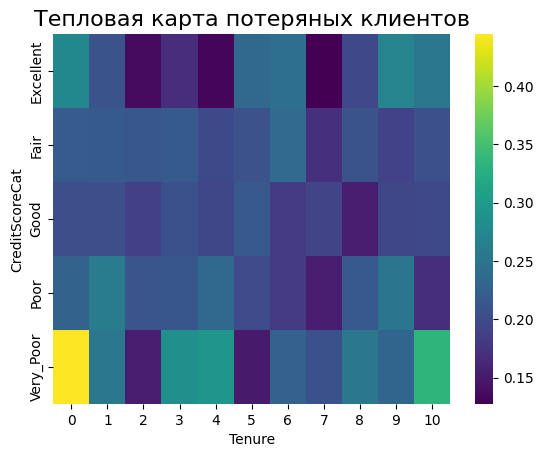

In [255]:

import seaborn as sns
print(sns.__version__)

hot_data.columns = hot_data.columns.astype('string')
display(hot_data)

heatmap = sns.heatmap(data=hot_data, cmap='viridis')
heatmap.set_title('Тепловая карта потеряных клиентов', fontsize=16);

Вывод: категории клиентов, которые уходят чаще всего 'Very_Poor' и 'Excellent' 